# Setup

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [21]:
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
import scipy
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles, venn3_unweighted
from scipy.optimize import curve_fit

In [3]:
# Setup figure params
plt.rcParams["pdf.use14corefonts"] = True
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = "Helvetica"
sc.set_figure_params(dpi=80, dpi_save=300, facecolor="white", frameon=False)
sns.set_context("paper")
plt.rcParams["axes.grid"] = False
plt.rcParams['axes.unicode_minus'] = False
cmap = sns.color_palette("colorblind")

In [4]:
warnings.resetwarnings()

# Import data

In [5]:
processedDataPath = "/mnt/iacchus/joe/processed_data/"

## Entropy scores

In [6]:
cell_type_entropy = pd.read_csv("../../analysis/entropy/cell_x_gene_atlas_cell_type_entropy.csv")
cell_type_entropy.index = cell_type_entropy.feature_name

tissue_entropy = pd.read_csv("../../analysis/entropy/cell_x_gene_atlas_tissue_entropy.csv")
tissue_entropy.index = tissue_entropy.feature_name

tissue_general_entropy = pd.read_csv("../../analysis/entropy/cell_x_gene_atlas_tissue_general_entropy.csv")
tissue_general_entropy.index = tissue_general_entropy.feature_name

entropies = {"cell_type": cell_type_entropy, "tissue": tissue_entropy, "tissue_general": tissue_general_entropy}

for entropy in entropies.values():
    del entropy["feature_name"]

## Cellxgene expression

In [7]:
cell_type_expression = np.load(f"{processedDataPath}/cell_x_gene_atlas/expression/cell_x_gene_atlas_cell_type_expression.npy")
index = pd.read_csv(f"{processedDataPath}/cell_x_gene_atlas/expression/cell_type_index.csv").cell_type
genes = pd.read_csv(f"{processedDataPath}/cell_x_gene_atlas/expression/keep_genes.csv").feature_name
cell_type_expression = pd.DataFrame(cell_type_expression, index=index, columns=genes)

tissue_expression = np.load(f"{processedDataPath}/cell_x_gene_atlas/expression/cell_x_gene_atlas_tissue_expression.npy")
index = pd.read_csv(f"{processedDataPath}/cell_x_gene_atlas/expression/tissue_index.csv").tissue
tissue_expression = pd.DataFrame(tissue_expression, index=index, columns=genes)

tissue_general_expression = np.load(f"{processedDataPath}/cell_x_gene_atlas/expression/cell_x_gene_atlas_tissue_general_expression.npy")
index = pd.read_csv(f"{processedDataPath}/cell_x_gene_atlas/expression/tissue_general_index.csv").tissue_general
tissue_general_expression = pd.DataFrame(tissue_general_expression, index=index, columns=genes)

expressions = {"cell_type": cell_type_expression, "tissue": tissue_expression, "tissue_general": tissue_general_expression}

# Add gene expression metadata

In [8]:
cell_type_z_score = scipy.stats.zscore(cell_type_expression)

for entropy in entropies.values():
    entropy["peak_cell_types"] = "None"
for gene in cell_type_z_score:
    if len(cell_type_z_score[cell_type_z_score[gene] > 2]) > 0:
        for entropy in entropies.values():
            entropy.loc[gene, "peak_cell_types"] = ",".join(cell_type_z_score[cell_type_z_score[gene] > 2].index.tolist())
    for entropy in entropies.values():
        entropy.loc[gene, "max_average_cell_type_expression"] = cell_type_expression[gene].max()

In [9]:
tissue_z_score = scipy.stats.zscore(tissue_expression)

for entropy in entropies.values():
    entropy["peak_tissue"] = "None"
for gene in tissue_z_score:
    if len(tissue_z_score[tissue_z_score[gene] > 2]) > 0:
        for entropy in entropies.values():
            entropy.loc[gene, "peak_tissue"] = ",".join(tissue_z_score[tissue_z_score[gene] > 2].index.tolist())
    for entropy in entropies.values():
        entropy.loc[gene, "max_average_tissue_expression"] = tissue_expression[gene].max()

# Cell x gene scores

In [10]:
def tau_score(expression):
    tau_score = expression/expression.max()
    tau_score = 1-tau_score
    tau_score = pd.DataFrame(tau_score.sum()/(tau_score.shape[0]-1))
    tau_score.columns = ["tau"]
    return tau_score

In [11]:
tau_scores = {}
for key, expression in expressions.items():
    tau_scores[key] = tau_score(expression)
    entropies[key]["tau_score"] = tau_scores[key].tau

cell_type
Tau thresh: 0.85, entropy thresh: 0.2839581409096462
Tau thresh: 0.9, entropy thresh: 0.39663627135567153
Tau thresh: 0.95, entropy thresh: 0.5540264887316196


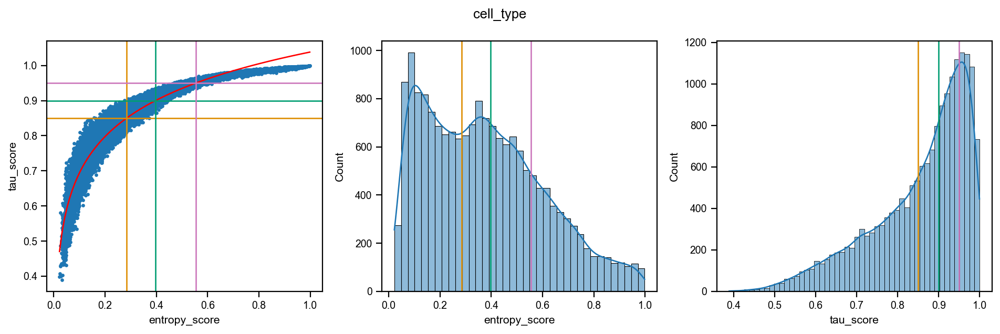

SignificanceResult(statistic=0.9883368047123267, pvalue=0.0)

tissue
Tau thresh: 0.85, entropy thresh: 0.47673212388615044
Tau thresh: 0.9, entropy thresh: 0.6140963591687825
Tau thresh: 0.95, entropy thresh: 0.7910403336579299


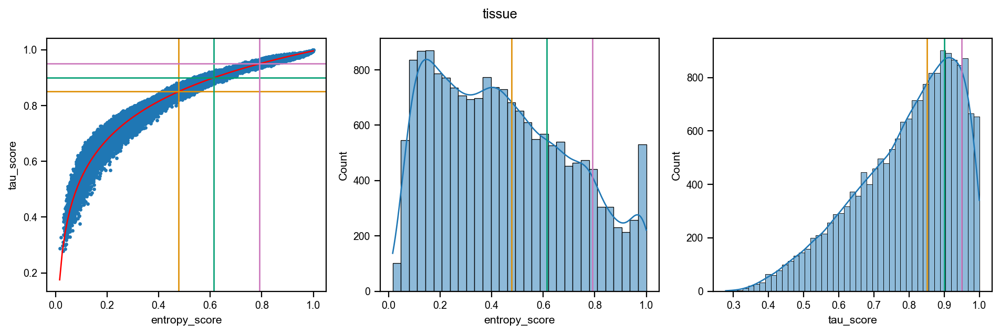

SignificanceResult(statistic=0.9921994572441637, pvalue=0.0)

tissue_general
Tau thresh: 0.85, entropy thresh: 0.4969601766827876
Tau thresh: 0.9, entropy thresh: 0.6400290337440264
Tau thresh: 0.95, entropy thresh: 0.8242856938148296


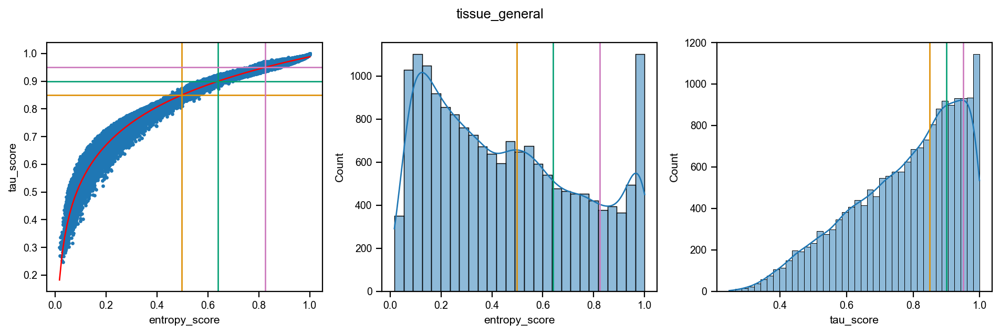

SignificanceResult(statistic=0.9929938410199642, pvalue=0.0)



In [12]:
tau_thresholds = [0.85, 0.9, 0.95]
colors = [cmap[1], cmap[2], cmap[4]]

def function(x, a, b):
    return a*np.log2(x)+b

for key, entropy in entropies.items():
    print(key)
    plt.figure(figsize=(12,4))
    params, covariance = curve_fit(function, entropy.entropy_score, entropy.tau_score)
    a_fit, b_fit = params

    plt.subplot(1,3,1)
    plt.scatter(
        x=entropy.entropy_score,
        y=entropy.tau_score,
        s=5,
        rasterized=True,
    )
    plt.xlabel("entropy_score")
    plt.ylabel("tau_score")
    
    x_fit = np.linspace(min(entropy.entropy_score), max(entropy.entropy_score), 100)
    y_fit = function(x_fit, a_fit, b_fit)
    plt.plot(x_fit, y_fit, 'r-', label='Fitted Curve')
    for i,tau_threshold in enumerate(tau_thresholds):
        entropy_threshold = 2**((tau_threshold-b_fit)/a_fit)
        plt.axhline(y=tau_threshold, color=colors[i])
        plt.axvline(x=entropy_threshold, color=colors[i])

    plt.subplot(1,3,2)
    sns.histplot(
        entropy,
        x="entropy_score",
        kde=True
    )
    for i,tau_threshold in enumerate(tau_thresholds):
        entropy_threshold = 2**((tau_threshold-b_fit)/a_fit)
        print(f"Tau thresh: {tau_threshold}, entropy thresh: {entropy_threshold}")
        plt.axvline(x=entropy_threshold, color=colors[i])

    plt.subplot(1,3,3)
    sns.histplot(
        entropy.tau_score,
        kde=True
    )
    for i,tau_threshold in enumerate(tau_thresholds):
        plt.axvline(x=tau_threshold, color=colors[i])

    plt.suptitle(f"{key}")
    plt.tight_layout()
    if key != "tissue_general":
        plt.savefig(f"../../analysis/TRA/figures/{key}_score_threshold.pdf", dpi=300)
    plt.show()

    print(scipy.stats.spearmanr(entropy.entropy_score, entropy.tau_score))
    for tau_threshold in tau_thresholds:
        entropy[f"tau_TRA_{tau_threshold}"] = entropy.tau_score > tau_threshold
        entropy_threshold = 2**((tau_threshold-b_fit)/a_fit)
        entropy[f"entropy_TRA_{tau_threshold}"] = entropy.entropy_score > entropy_threshold
    print()

cell_type non-TRA, tau thresh: 0.85


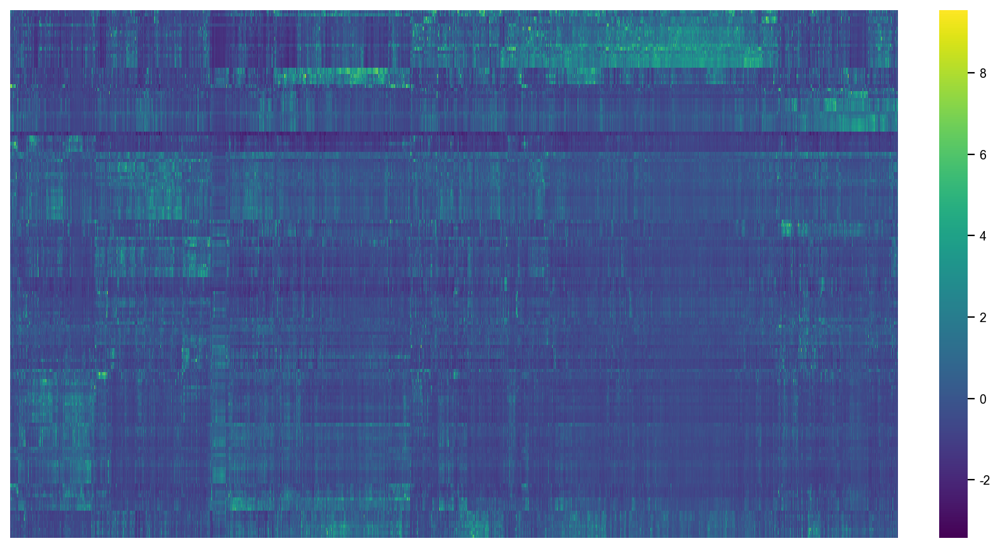

cell_type TRA, tau thresh: 0.85


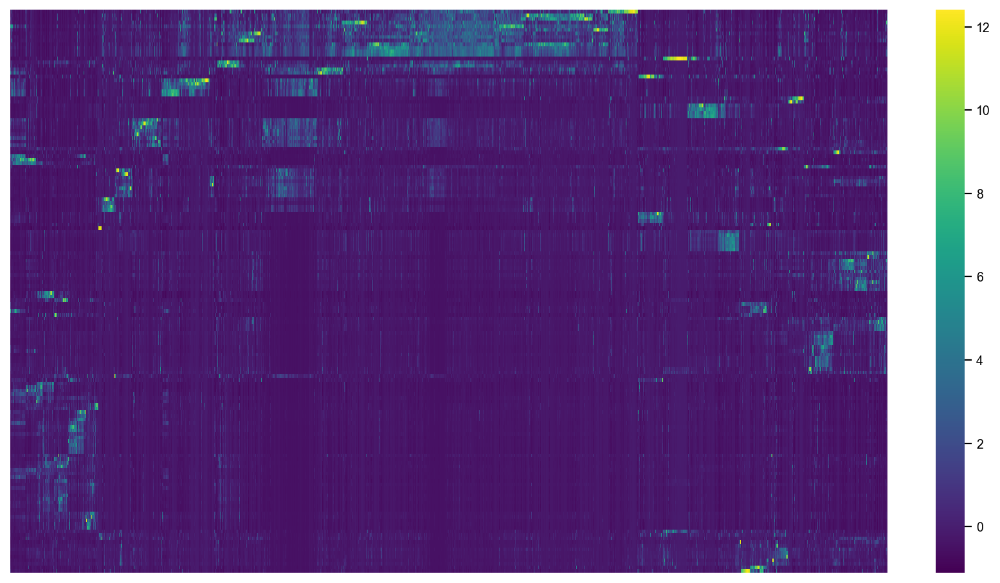

cell_type ambiguous, tau thresh: 0.85


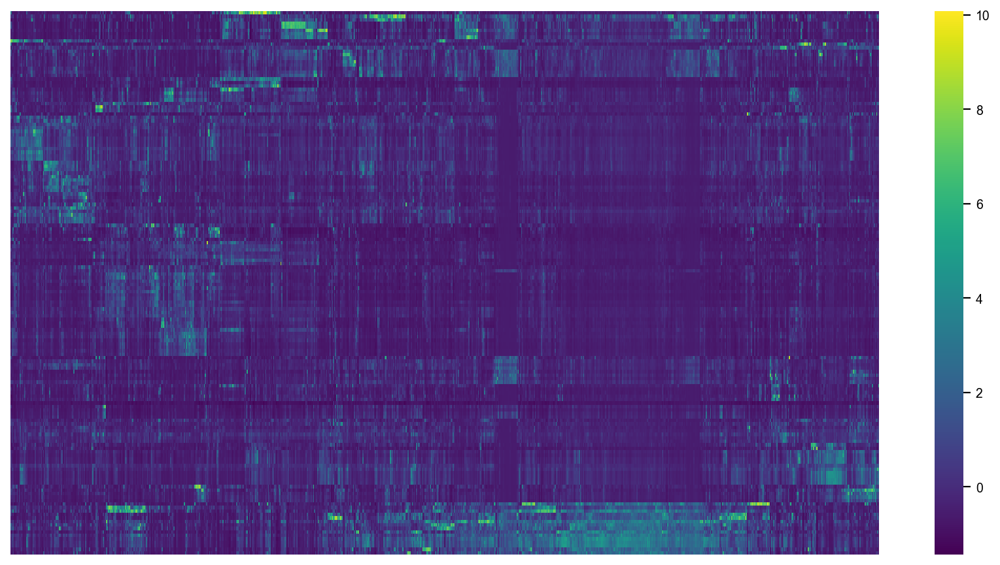

cell_type non-TRA, tau thresh: 0.9


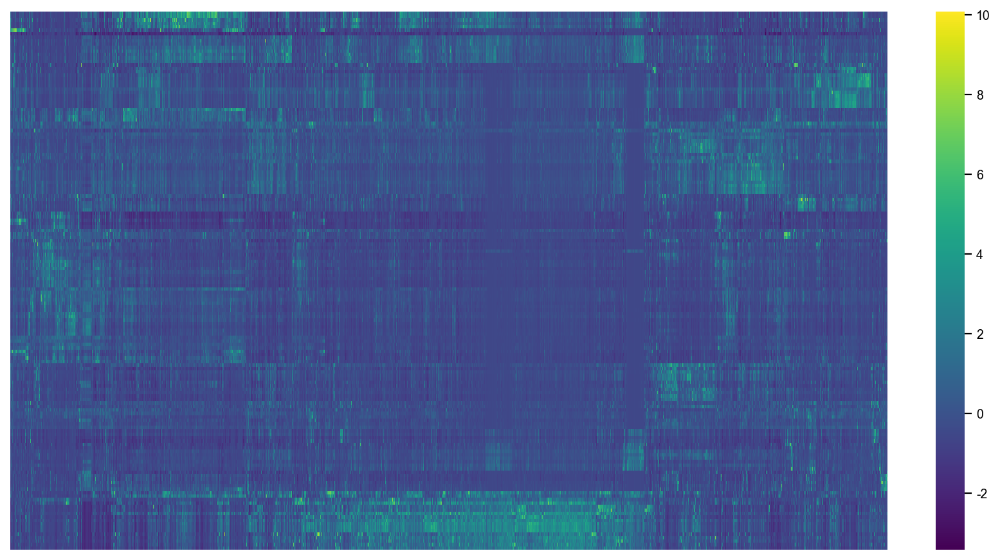

cell_type TRA, tau thresh: 0.9


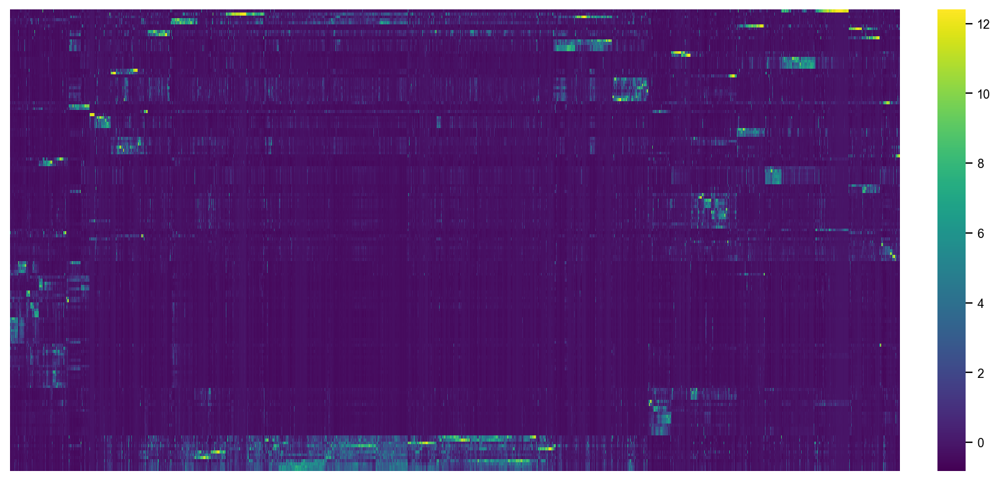

cell_type ambiguous, tau thresh: 0.9


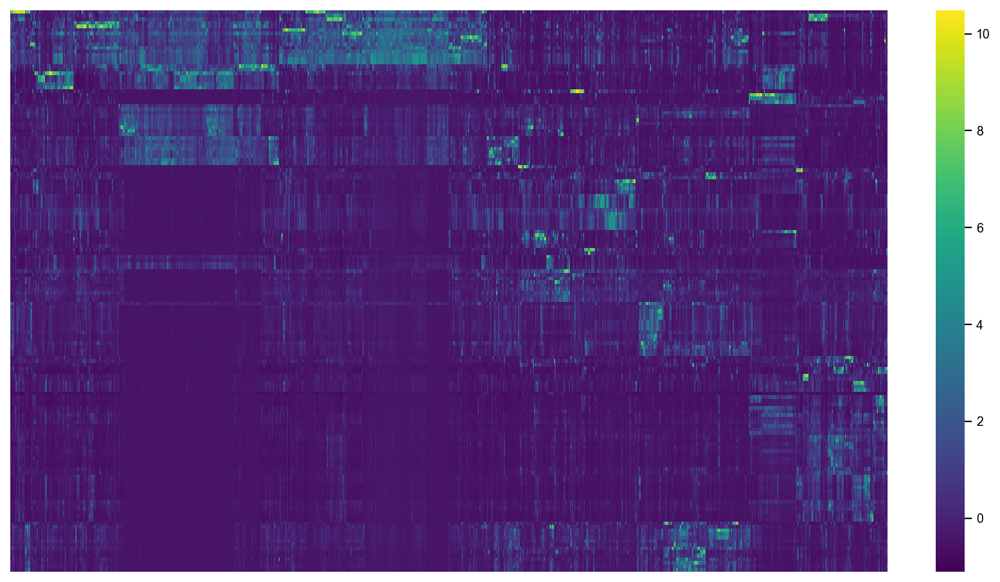

cell_type non-TRA, tau thresh: 0.95


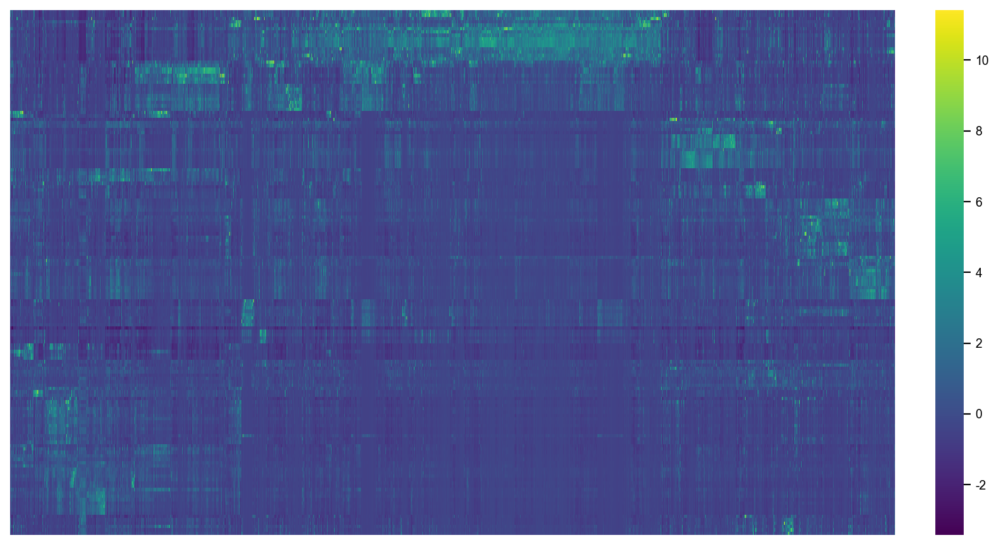

cell_type TRA, tau thresh: 0.95


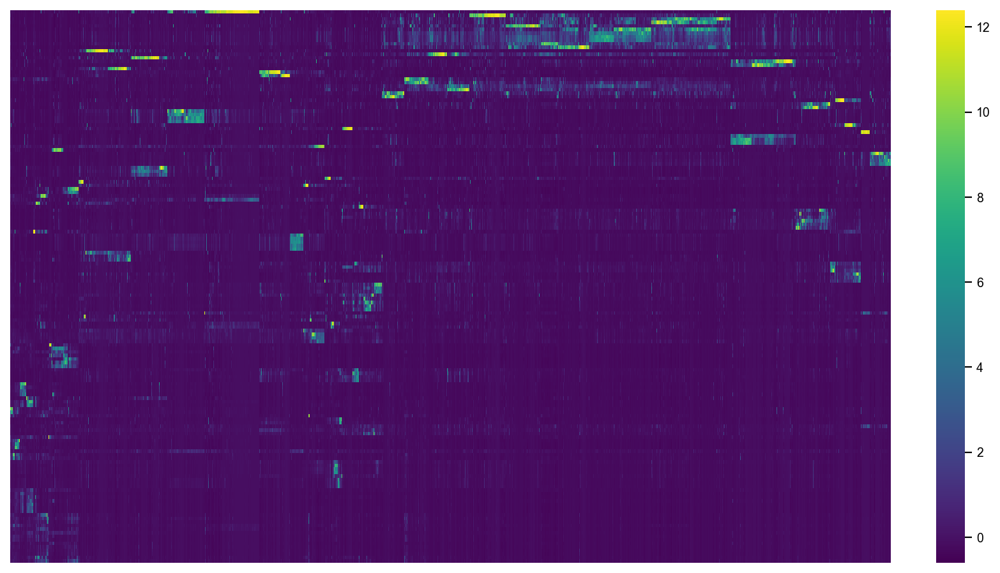

cell_type ambiguous, tau thresh: 0.95


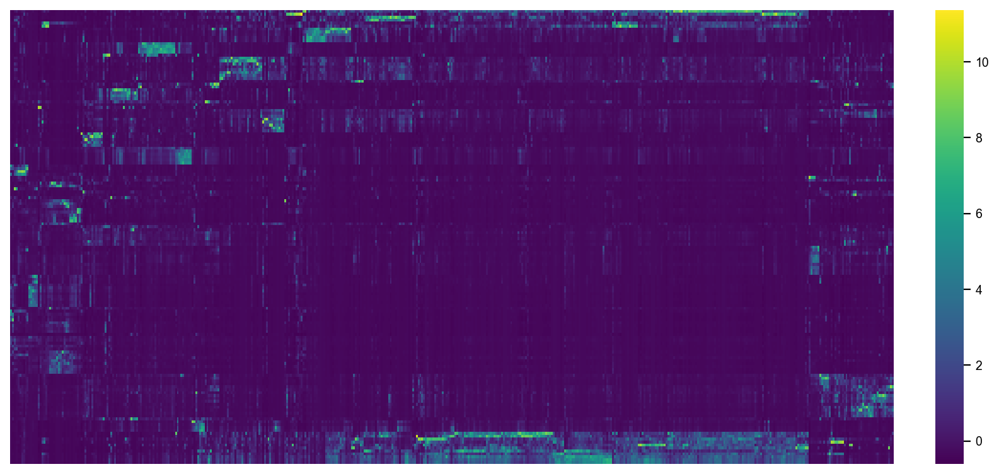

tissue non-TRA, tau thresh: 0.85


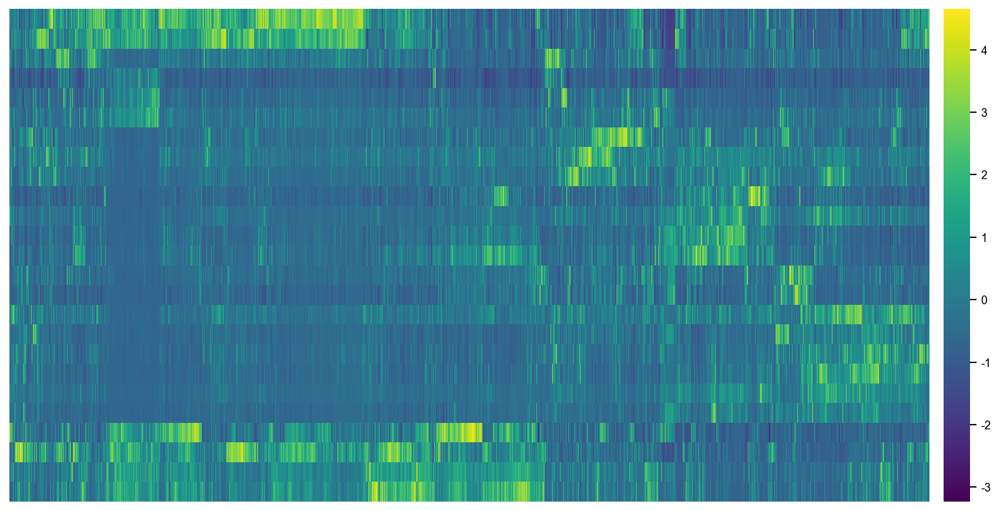

tissue TRA, tau thresh: 0.85


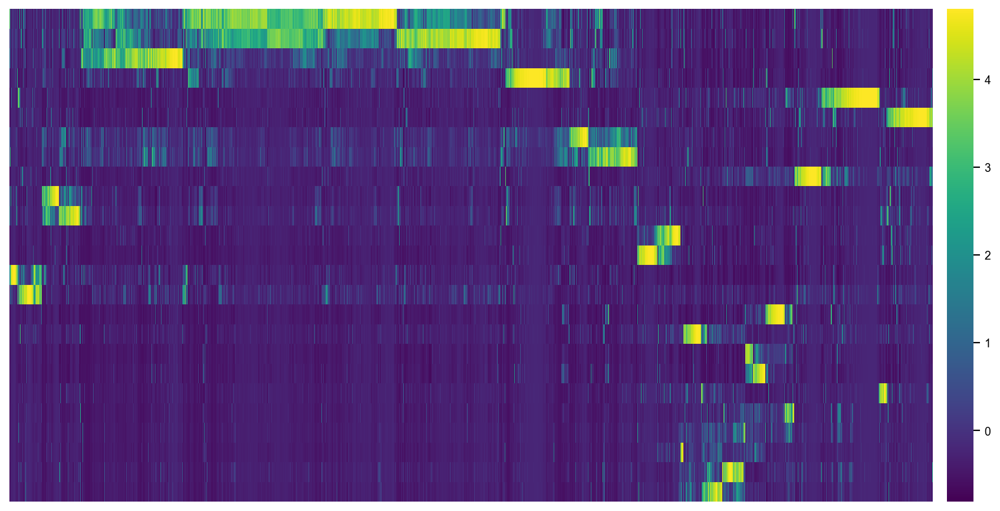

tissue ambiguous, tau thresh: 0.85


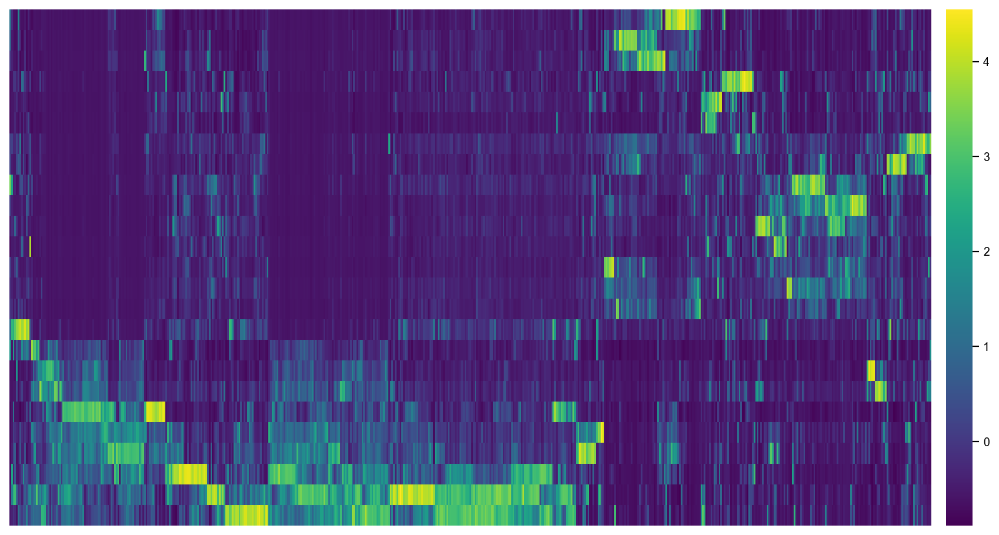

tissue non-TRA, tau thresh: 0.9


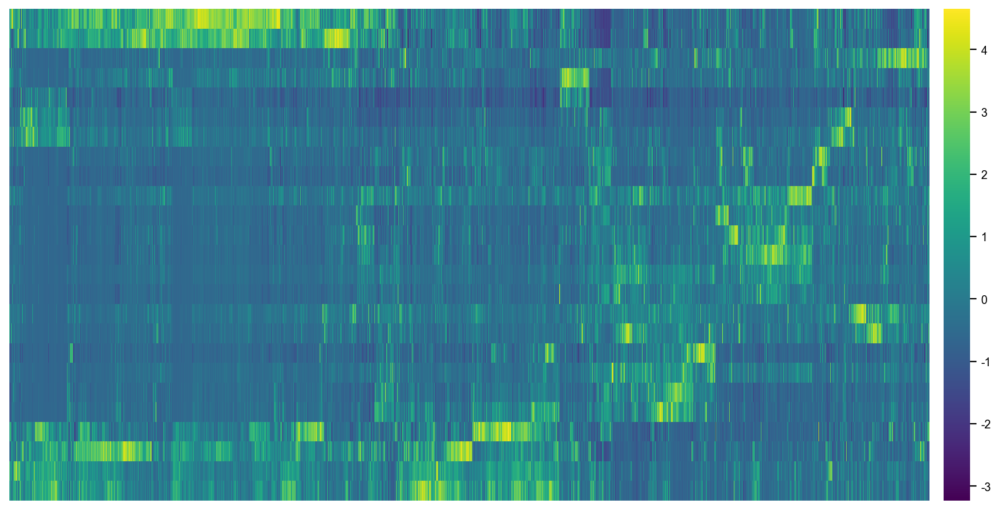

tissue TRA, tau thresh: 0.9


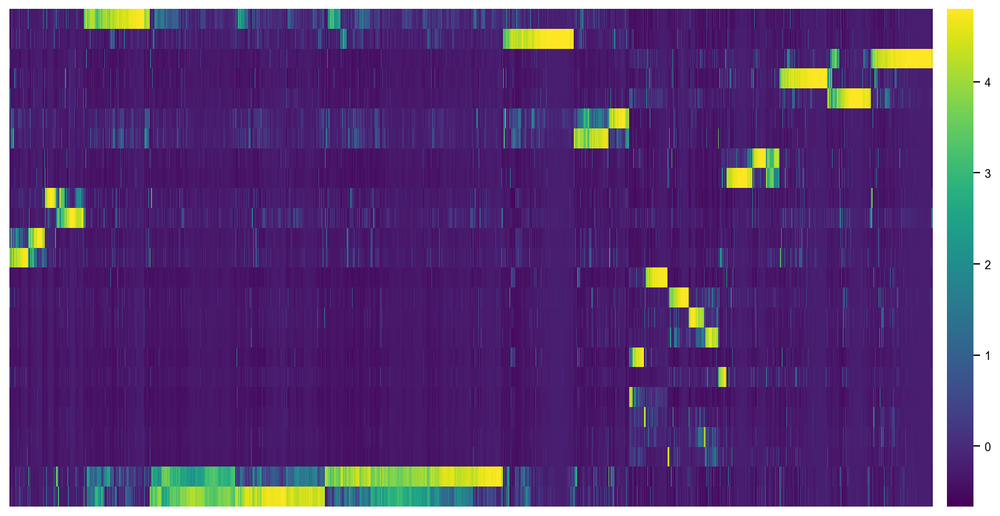

tissue ambiguous, tau thresh: 0.9


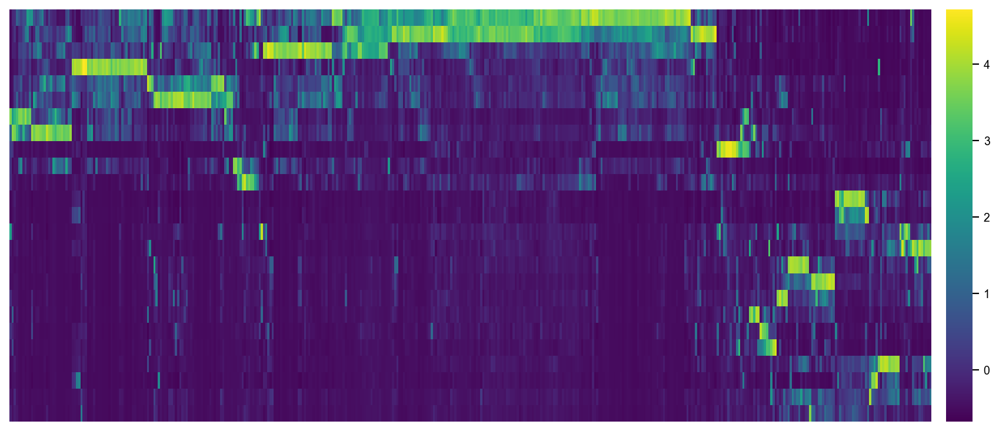

tissue non-TRA, tau thresh: 0.95


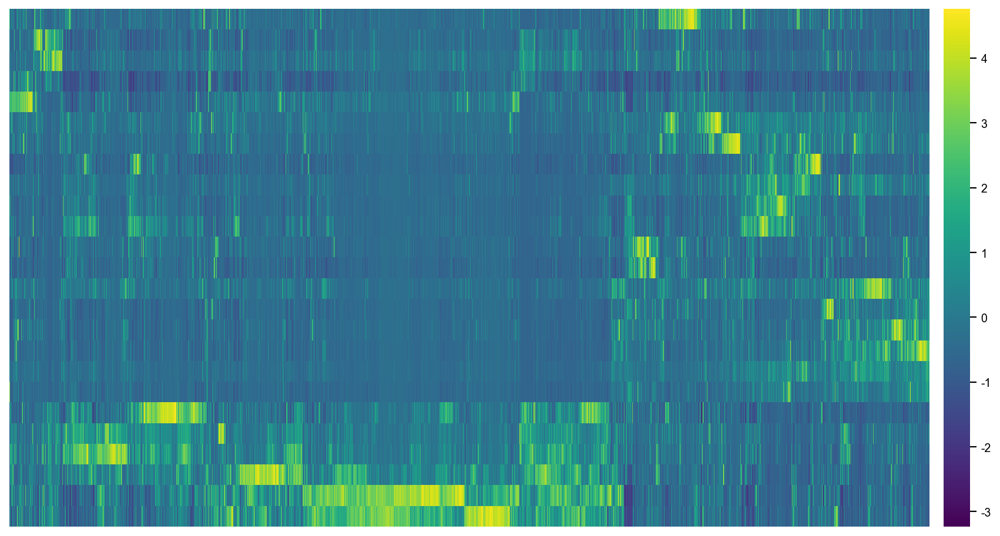

tissue TRA, tau thresh: 0.95


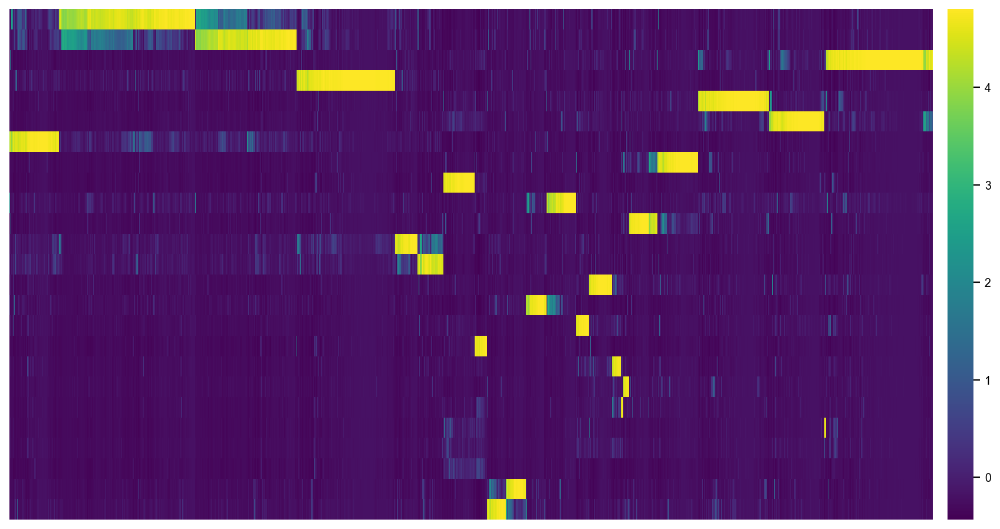

tissue ambiguous, tau thresh: 0.95


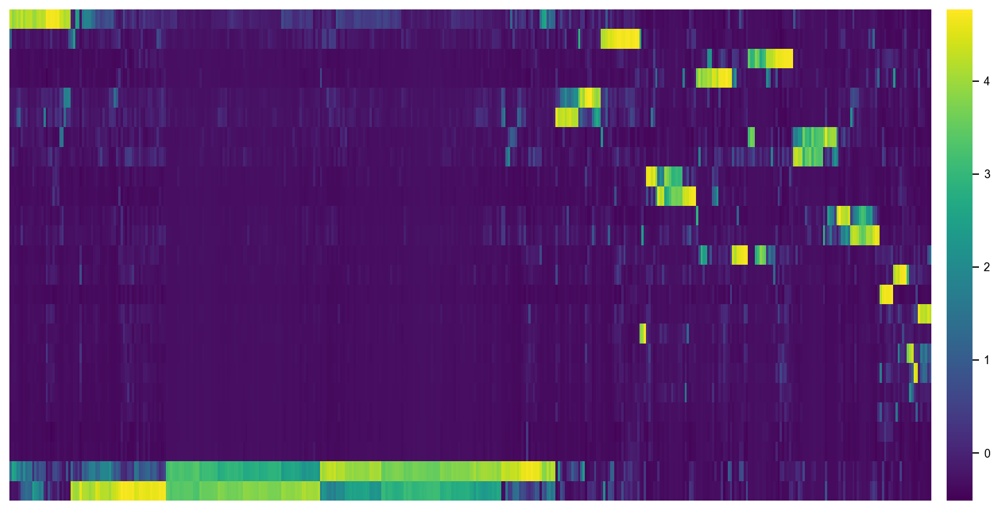

tissue_general non-TRA, tau thresh: 0.85


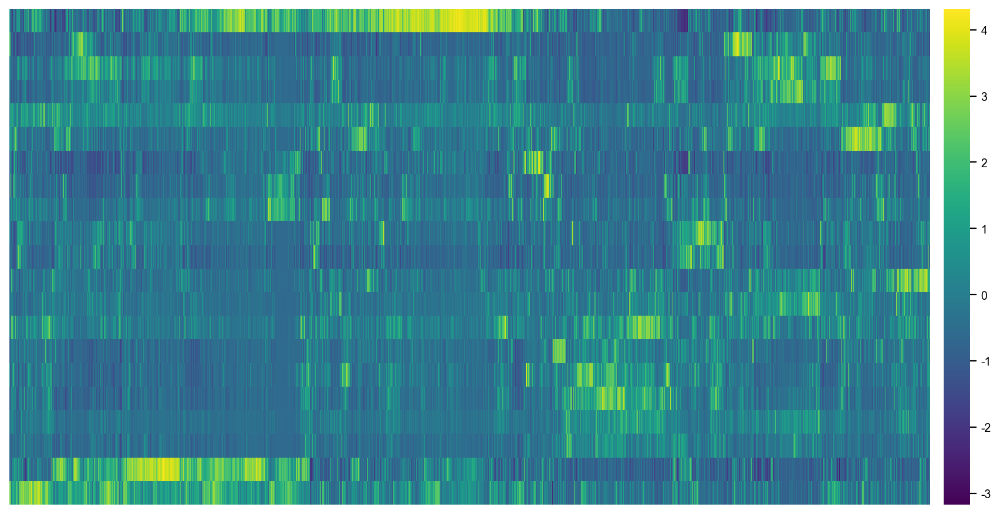

tissue_general TRA, tau thresh: 0.85


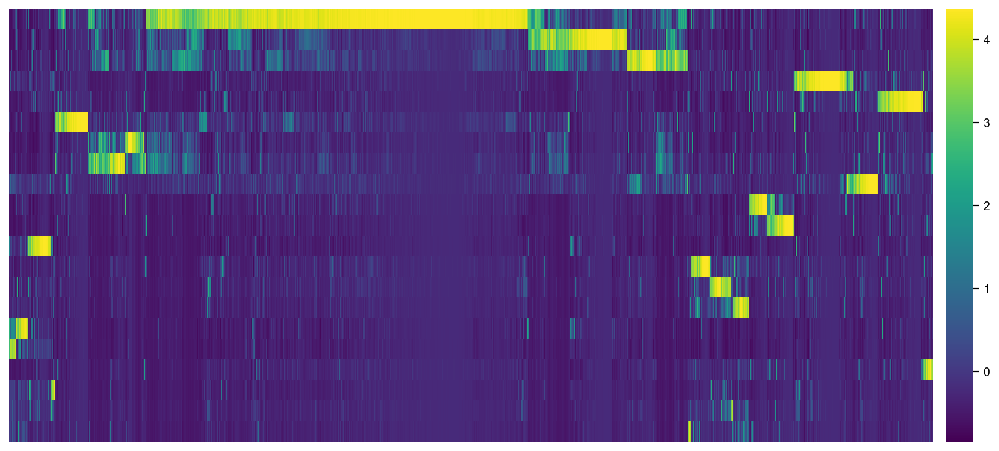

tissue_general ambiguous, tau thresh: 0.85


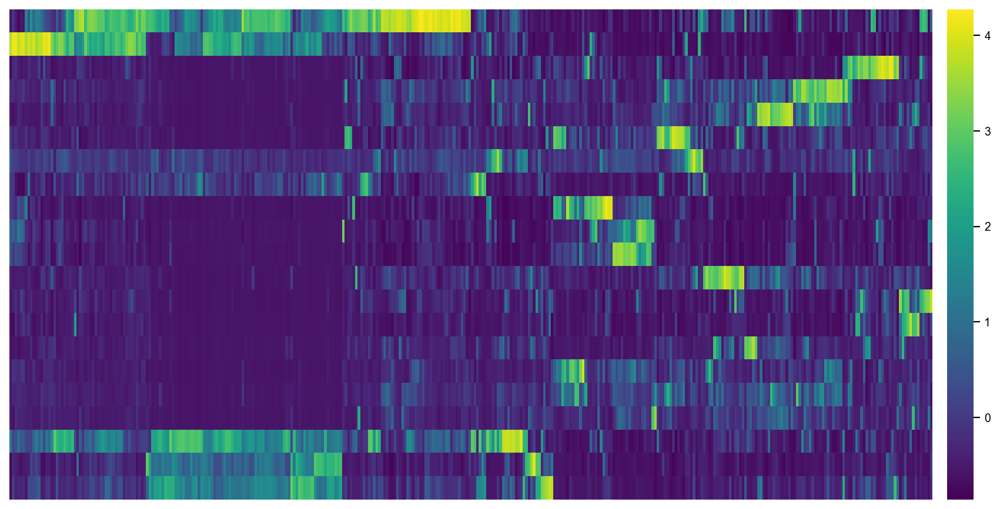

tissue_general non-TRA, tau thresh: 0.9


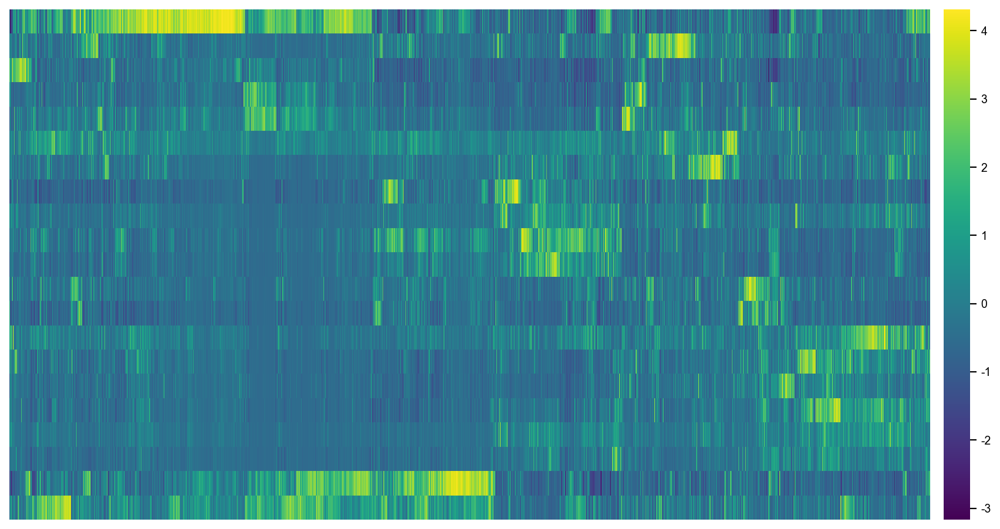

tissue_general TRA, tau thresh: 0.9


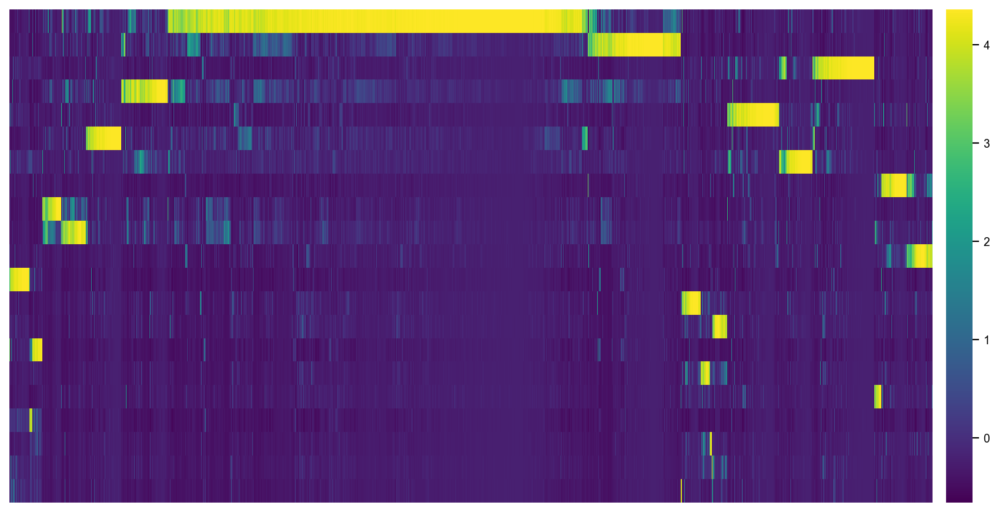

tissue_general ambiguous, tau thresh: 0.9


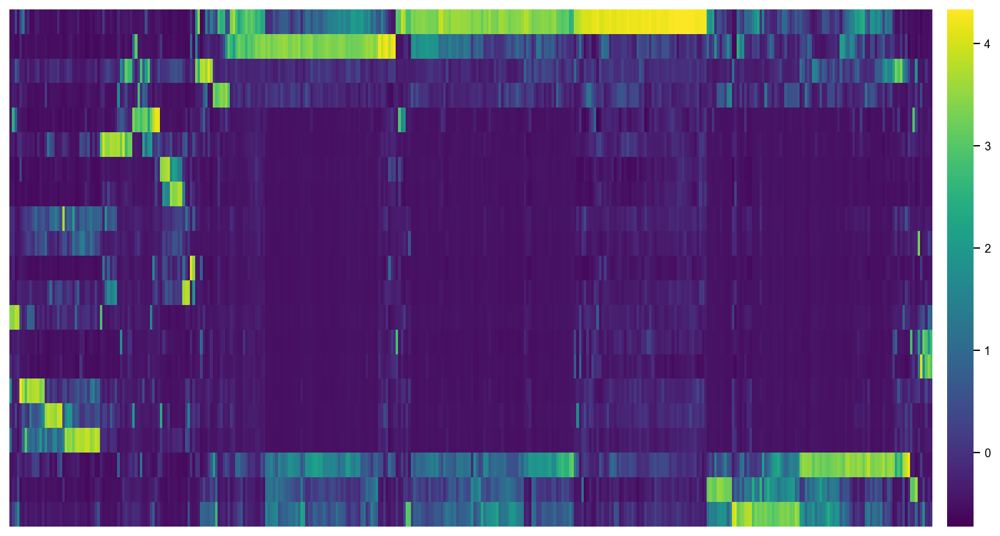

tissue_general non-TRA, tau thresh: 0.95


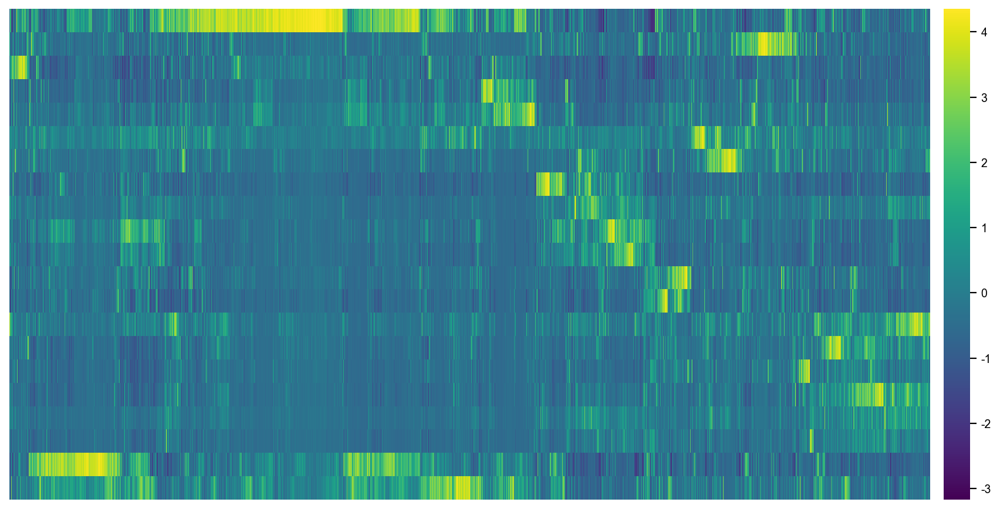

tissue_general TRA, tau thresh: 0.95


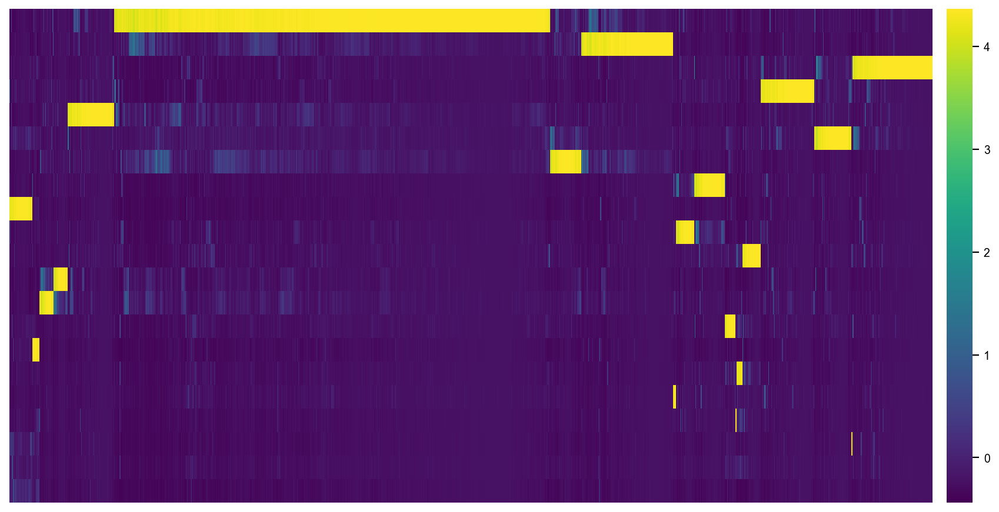

tissue_general ambiguous, tau thresh: 0.95


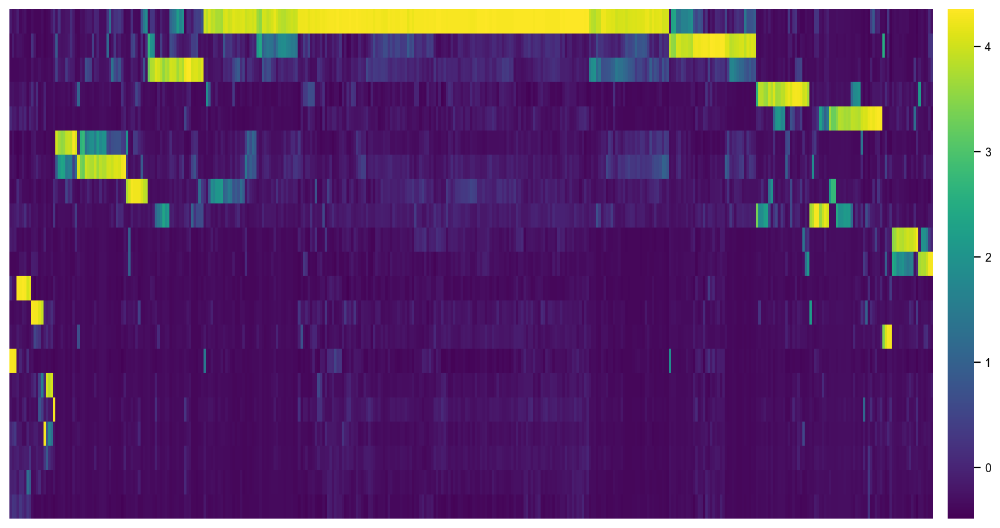

In [13]:
for key, entropy in entropies.items():
    for tau_threshold in tau_thresholds:
        nonTRA = entropy[~entropy[f"tau_TRA_{tau_threshold}"] & ~entropy[f"entropy_TRA_{tau_threshold}"]]
        TRA = entropy[entropy[f"tau_TRA_{tau_threshold}"] & entropy[f"entropy_TRA_{tau_threshold}"]]
        ambiguous = entropy[~entropy.index.isin(nonTRA.index.tolist() + TRA.index.tolist())]

        cg = sns.clustermap(
            expressions[key][nonTRA.index],
            z_score=1,
            figsize=(14,8),
            col_cluster=True,
            row_cluster=True,
            cmap="viridis",
        )
        cg.ax_cbar.set_position([cg.ax_heatmap.get_position().bounds[2]+0.2, cg.ax_heatmap.get_position().bounds[1], 0.02, cg.ax_heatmap.get_position().height])
        cg.ax_heatmap.set_xticks([])
        cg.ax_heatmap.set_yticks([])
        cg.ax_heatmap.set_xlabel("")
        cg.ax_heatmap.set_ylabel("")
        cg.ax_row_dendrogram.set_visible(False)
        cg.ax_col_dendrogram.set_visible(False)
        print(f"{key} non-TRA, tau thresh: {tau_threshold}")
        # plt.tight_layout()
        if tau_threshold == 0.9 and key == "cell_type":
            plt.savefig(f"../../analysis/TRA/figures/{key}_nonTRA_heatmap.png", dpi=300)
        plt.show()

        cg = sns.clustermap(
            expressions[key][TRA.index],
            z_score=1,
            figsize=(14,8),
            col_cluster=True,
            row_cluster=True,
            cmap="viridis",
        )
        cg.ax_cbar.set_position([cg.ax_heatmap.get_position().bounds[2]+0.2, cg.ax_heatmap.get_position().bounds[1], 0.02, cg.ax_heatmap.get_position().height])
        cg.ax_heatmap.set_xticks([])
        cg.ax_heatmap.set_yticks([])
        cg.ax_heatmap.set_xlabel("")
        cg.ax_heatmap.set_ylabel("")
        cg.ax_row_dendrogram.set_visible(False)
        cg.ax_col_dendrogram.set_visible(False)
        print(f"{key} TRA, tau thresh: {tau_threshold}")
        # plt.tight_layout()
        if tau_threshold == 0.9 and key == "cell_type":
            plt.savefig(f"../../analysis/TRA/figures/{key}_TRA_heatmap.png", dpi=300)
        plt.show()

        cg = sns.clustermap(
            expressions[key][ambiguous.index],
            z_score=1,
            figsize=(14,8),
            col_cluster=True,
            row_cluster=True,
            cmap="viridis"
        )
        cg.ax_cbar.set_position([cg.ax_heatmap.get_position().bounds[2]+0.2, cg.ax_heatmap.get_position().bounds[1], 0.02, cg.ax_heatmap.get_position().height])
        cg.ax_heatmap.set_xticks([])
        cg.ax_heatmap.set_yticks([])
        cg.ax_heatmap.set_xlabel("")
        cg.ax_heatmap.set_ylabel("")
        cg.ax_row_dendrogram.set_visible(False)
        cg.ax_col_dendrogram.set_visible(False)
        print(f"{key} ambiguous, tau thresh: {tau_threshold}")
        # plt.tight_layout()
        if tau_threshold == 0.9 and key == "cell_type":
            plt.savefig(f"../../analysis/TRA/figures/{key}_ambiguous_heatmap.png", dpi=300)
        plt.show()

# Tissue level comparison

## Tau

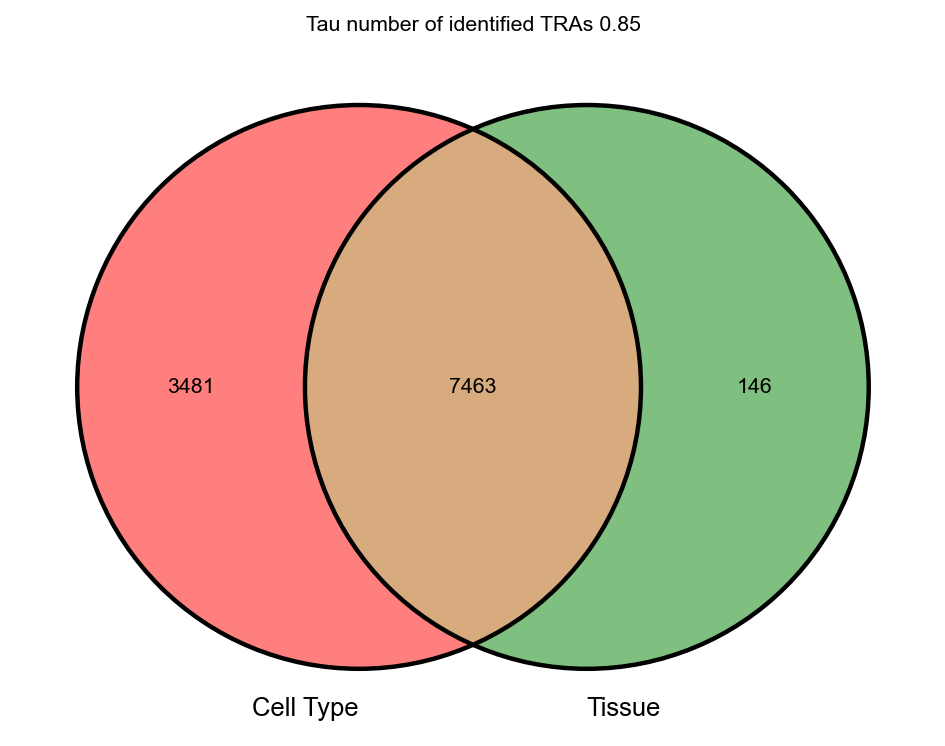

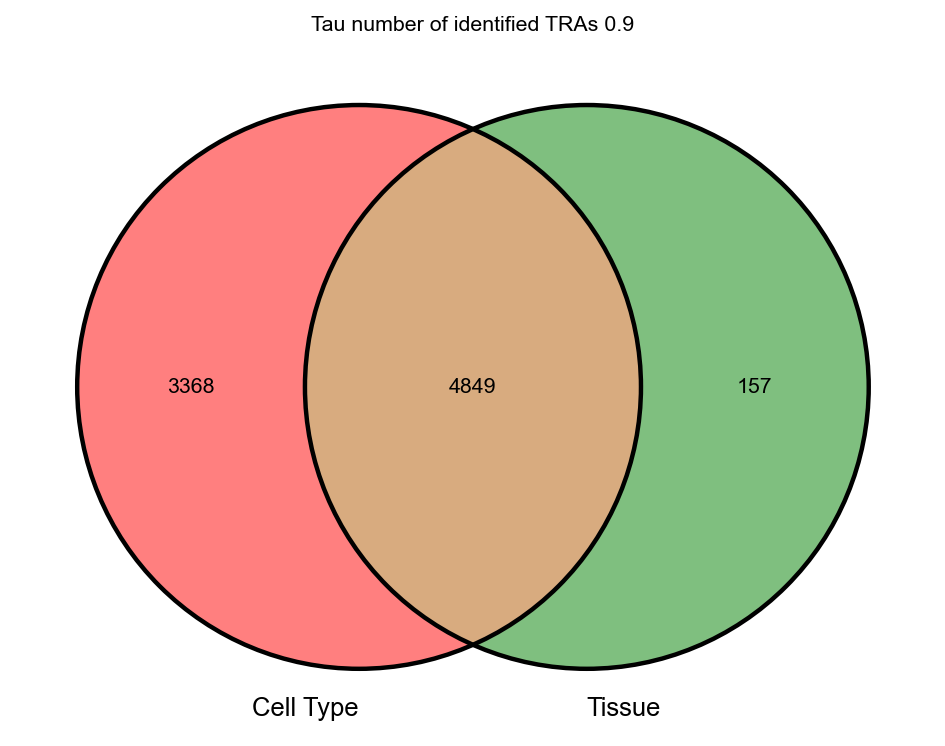

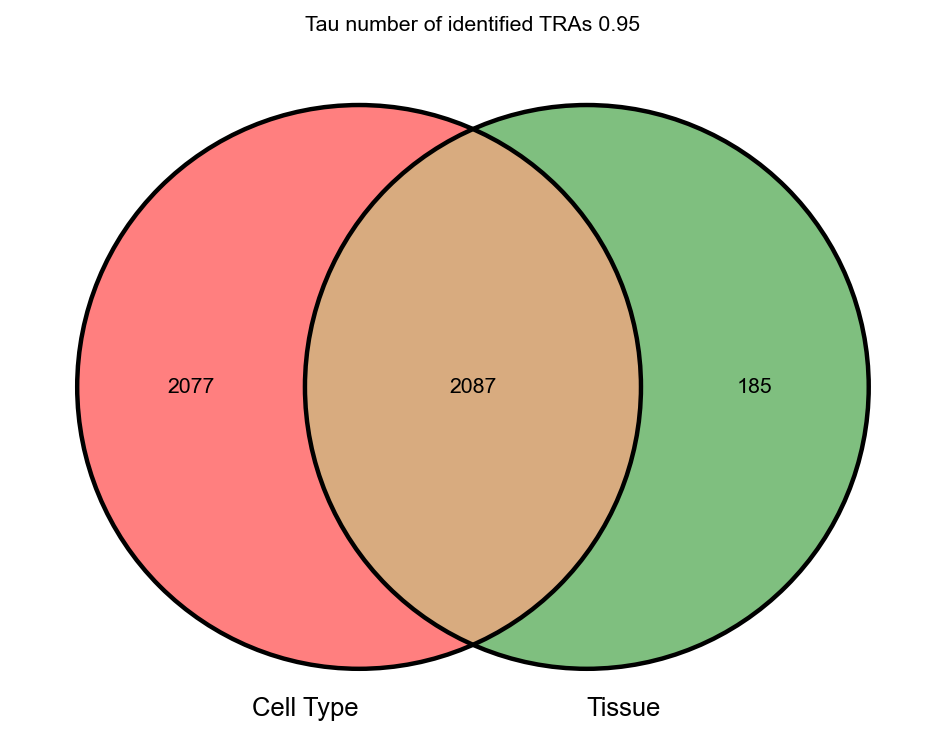

In [16]:
for tau_threshold in tau_thresholds:

    entropy_comparison = pd.DataFrame({
        "cell_type": entropies["cell_type"][f"tau_TRA_{tau_threshold}"],
        "tissue": entropies["tissue"][f"tau_TRA_{tau_threshold}"],
        "tissue_general": entropies["tissue_general"][f"tau_TRA_{tau_threshold}"]
    },)

    cell_type_unique = entropy_comparison[entropy_comparison.cell_type & ~entropy_comparison.tissue]
    tissue_unique = entropy_comparison[~entropy_comparison.cell_type & entropy_comparison.tissue]
    cell_type_tissue_shared = entropy_comparison[entropy_comparison.cell_type & entropy_comparison.tissue]

    plt.figure(figsize=(6,6))
    venn2_unweighted(
        subsets = (
            len(cell_type_unique),
            len(tissue_unique),
            len(cell_type_tissue_shared),
        ),
        set_labels = ('Cell Type', 'Tissue', 'Tissue General'),
        alpha = 0.5
    )
    venn2_circles((1,1,1))
    plt.title(f"Tau number of identified TRAs {tau_threshold}")
    plt.tight_layout()
    if tau_threshold in [0.85, 0.9, 0.95]:
        plt.savefig(f"../../analysis/TRA/figures/{tau_threshold}_tau_number_TRAs_across_annotation_levels.pdf", dpi=300)
    plt.show()

## Entropy

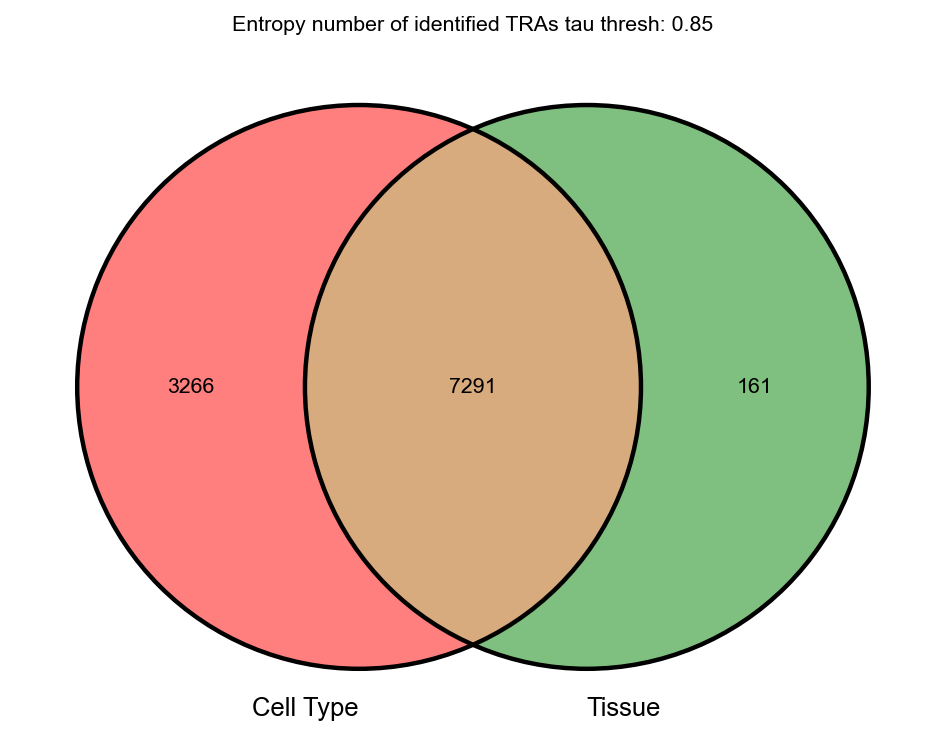

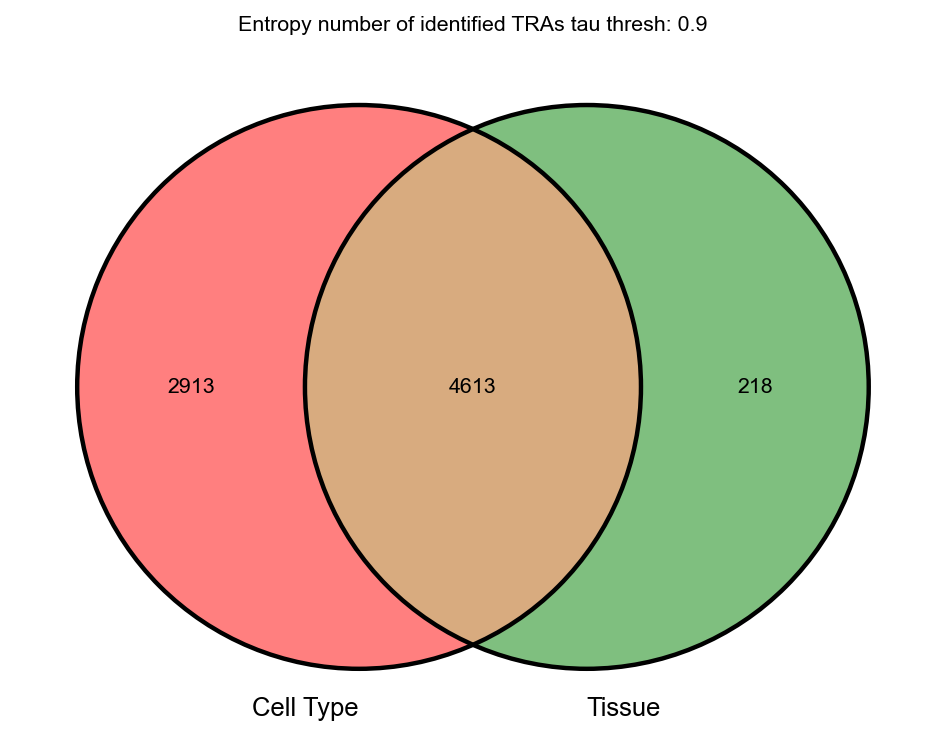

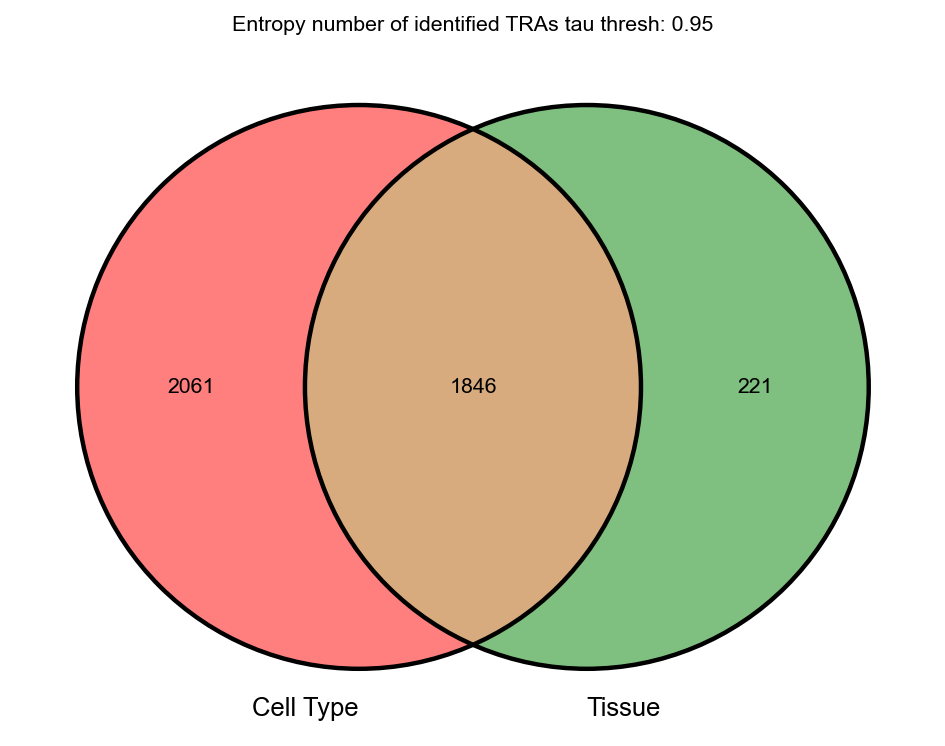

In [17]:
for tau_threshold in tau_thresholds:

    entropy_comparison = pd.DataFrame({
        "cell_type": entropies["cell_type"][f"entropy_TRA_{tau_threshold}"],
        "tissue": entropies["tissue"][f"entropy_TRA_{tau_threshold}"],
        "tissue_general": entropies["tissue_general"][f"entropy_TRA_{tau_threshold}"]
    },)

    cell_type_unique = entropy_comparison[entropy_comparison.cell_type & ~entropy_comparison.tissue]
    tissue_unique = entropy_comparison[~entropy_comparison.cell_type & entropy_comparison.tissue]
    cell_type_tissue_shared = entropy_comparison[entropy_comparison.cell_type & entropy_comparison.tissue]

    plt.figure(figsize=(6,6))
    venn2_unweighted(
        subsets = (
            len(cell_type_unique),
            len(tissue_unique),
            len(cell_type_tissue_shared),
        ),
        set_labels = ('Cell Type', 'Tissue', 'Tissue General'),
        alpha = 0.5
    )
    venn2_circles((1,1,1))
    plt.title(f"Entropy number of identified TRAs tau thresh: {tau_threshold}")
    plt.tight_layout()
    if tau_threshold in [0.85, 0.9, 0.95]:
        plt.savefig(f"../../analysis/TRA/figures/{tau_threshold}_entropy_number_TRAs_across_annotation_levels.pdf", dpi=300)
    plt.show()

# Sansom list

In [18]:
sansom_TRA = pd.read_csv("../../sansom_TRE.csv")
sansom_TRA.index = sansom_TRA["Gene Symbol"]
del sansom_TRA["Ensembl ID"]
sansom_TRA.columns = ["feature_name", "TRA"]
sansom_TRA = sansom_TRA[(sansom_TRA.TRA != "not present") & (sansom_TRA.TRA != "not detected") & (sansom_TRA.TRA != "TRE+NRE")]
sansom_TRA.TRA = sansom_TRA.TRA.replace({"TRE": True, "NRE": False})
sansom_TRA = sansom_TRA.drop_duplicates("feature_name")

# Method comparison

In [19]:
sansom_TRA = sansom_TRA[sansom_TRA.index.isin(entropies["cell_type"].index)].sort_index()
cell_type_entropy = entropies["cell_type"][entropies["cell_type"].index.isin(sansom_TRA.index)].sort_index()

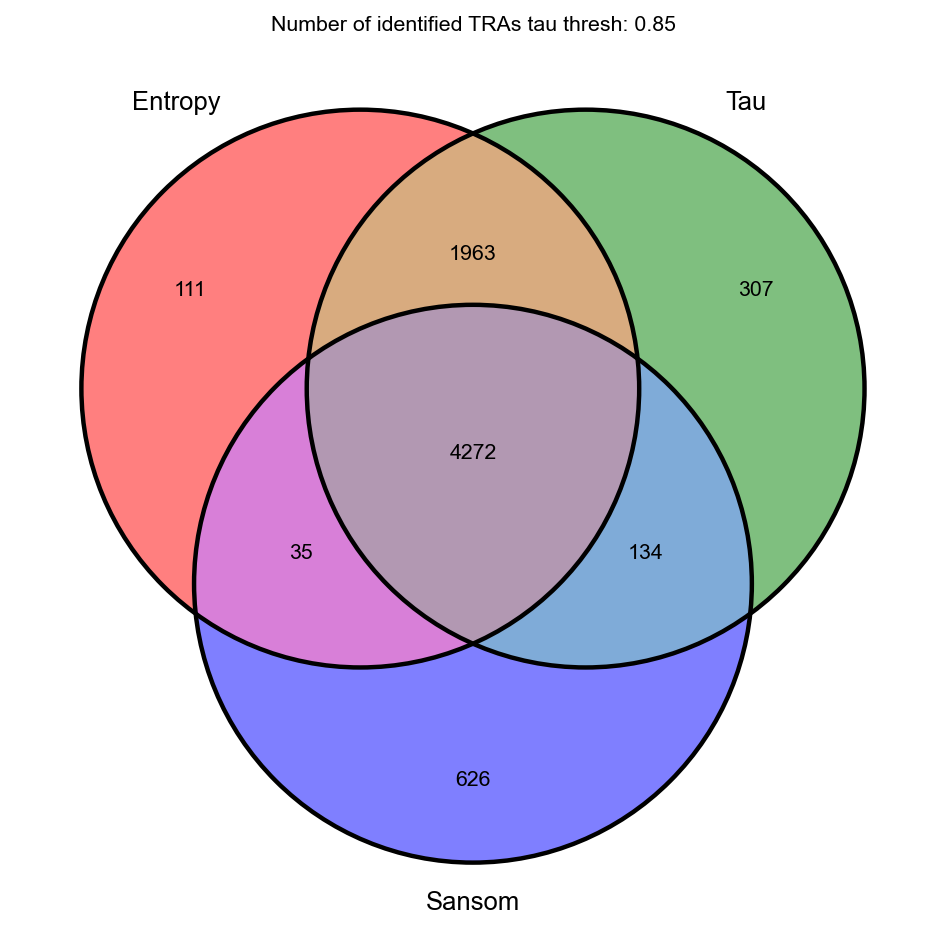

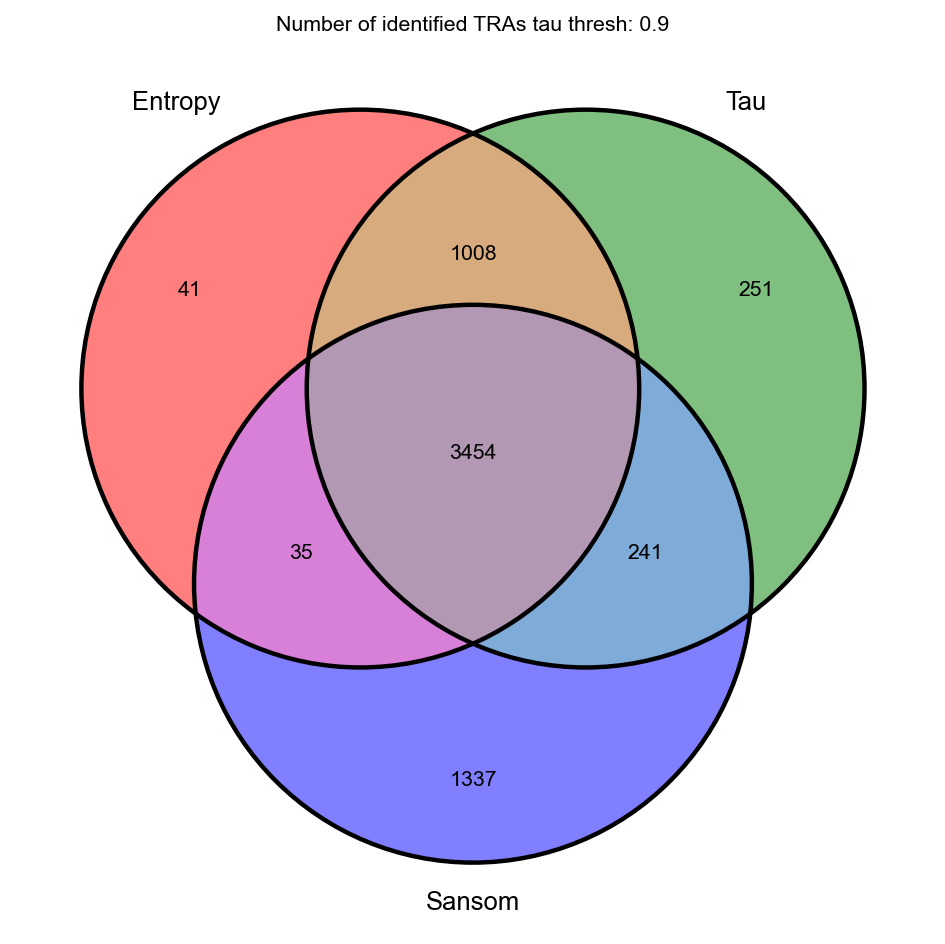

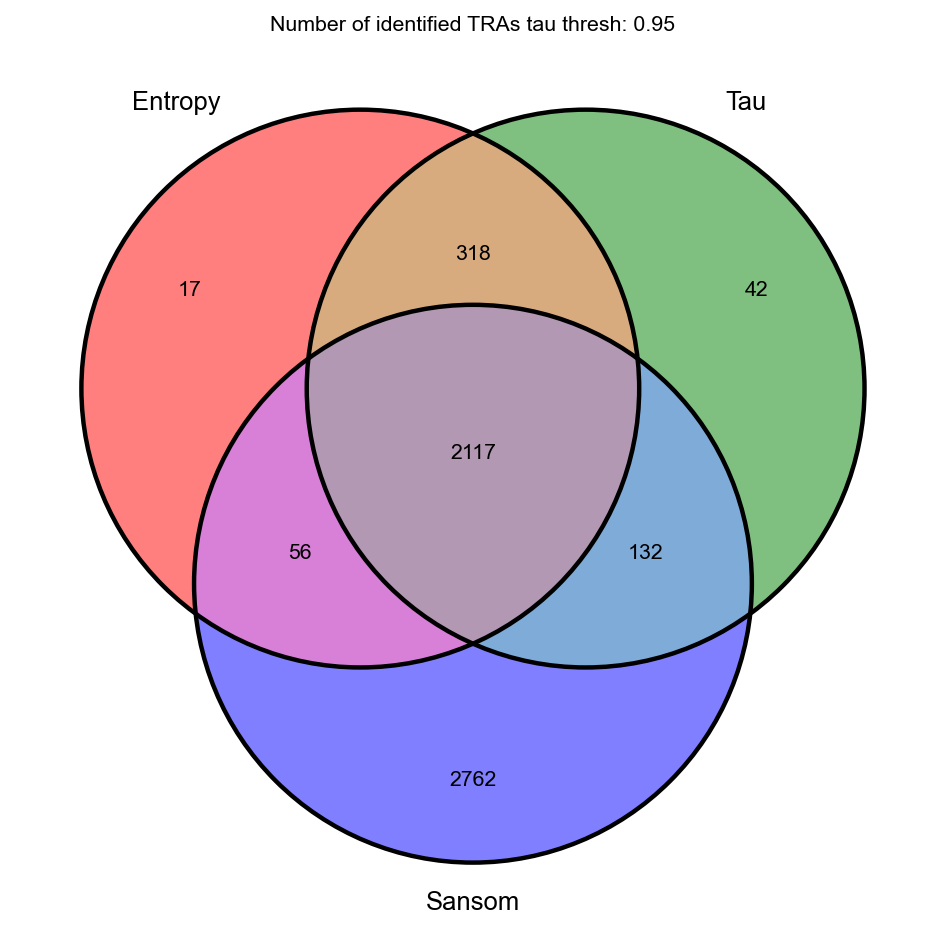

In [22]:
for tau_threshold in tau_thresholds:
    entropy_method_comparison = pd.DataFrame(
        {
            "entropy": cell_type_entropy[f"entropy_TRA_{tau_threshold}"],
            "tau": cell_type_entropy[f"tau_TRA_{tau_threshold}"],
            "sansom": sansom_TRA.TRA
        },
        index=cell_type_entropy.index
    )
    
    entropy_unique = entropy_method_comparison[entropy_method_comparison.entropy & ~entropy_method_comparison.tau & ~entropy_method_comparison.sansom]
    tau_unique = entropy_method_comparison[~entropy_method_comparison.entropy & entropy_method_comparison.tau & ~entropy_method_comparison.sansom]
    sansom_unique = entropy_method_comparison[~entropy_method_comparison.entropy & ~entropy_method_comparison.tau & entropy_method_comparison.sansom]
    
    entropy_tau_shared = entropy_method_comparison[entropy_method_comparison.entropy & entropy_method_comparison.tau & ~entropy_method_comparison.sansom]
    entropy_sansom_shared = entropy_method_comparison[entropy_method_comparison.entropy & ~entropy_method_comparison.tau & entropy_method_comparison.sansom]
    tau_sansom_shared = entropy_method_comparison[~entropy_method_comparison.entropy & entropy_method_comparison.tau & entropy_method_comparison.sansom]
    
    all_shared = entropy_method_comparison[entropy_method_comparison.entropy & entropy_method_comparison.tau & entropy_method_comparison.sansom]
    
    plt.figure(figsize=(6,6))
    venn3_unweighted(
        subsets = (
            len(entropy_unique),
            len(tau_unique),
            len(entropy_tau_shared),
            len(sansom_unique),
            len(entropy_sansom_shared),
            len(tau_sansom_shared),
            len(all_shared)
        ),
        set_labels = ('Entropy', 'Tau', 'Sansom'),
        alpha = 0.5
    )
    venn3_circles((1,1,1,1,1,1,1))
    plt.title(f"Number of identified TRAs tau thresh: {tau_threshold}")
    plt.tight_layout()
    if tau_threshold == 0.9:
        plt.savefig(f"../../analysis/TRA/figures/TRA_method_comparison.pdf", dpi=300)
    plt.show()

# Selected TRAs

In [23]:
gene_list = np.random.choice(cell_type_entropy[cell_type_entropy["tau_TRA_0.9"]].index, 10, replace=False)

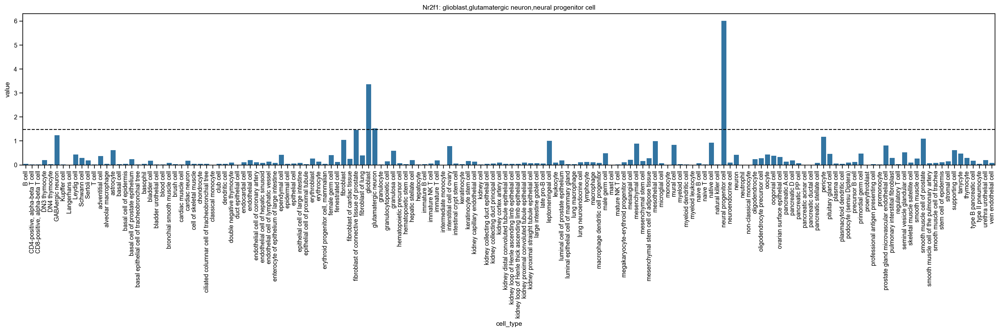

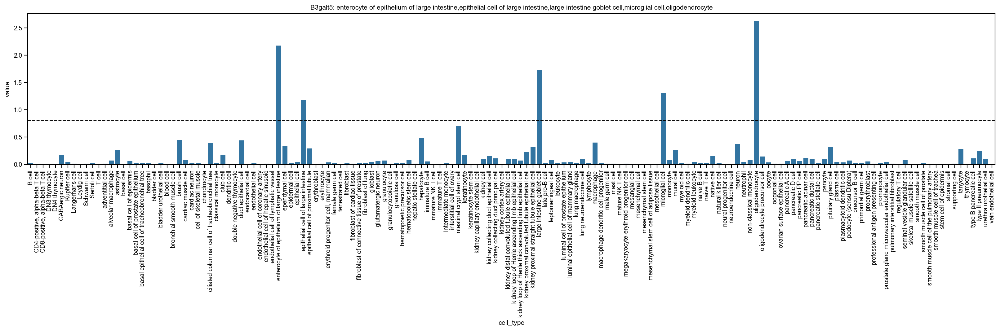

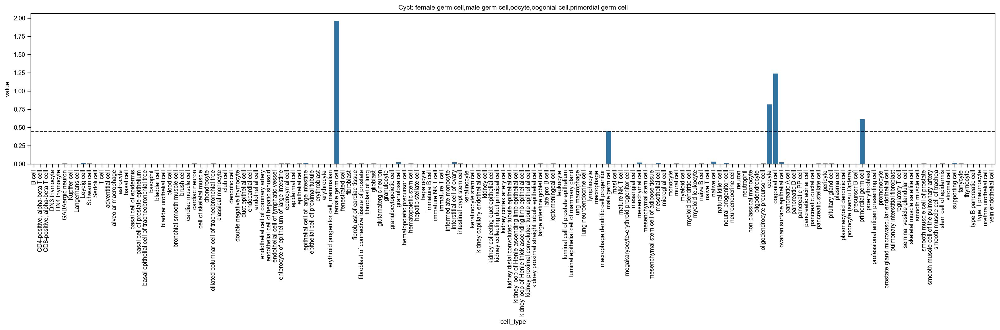

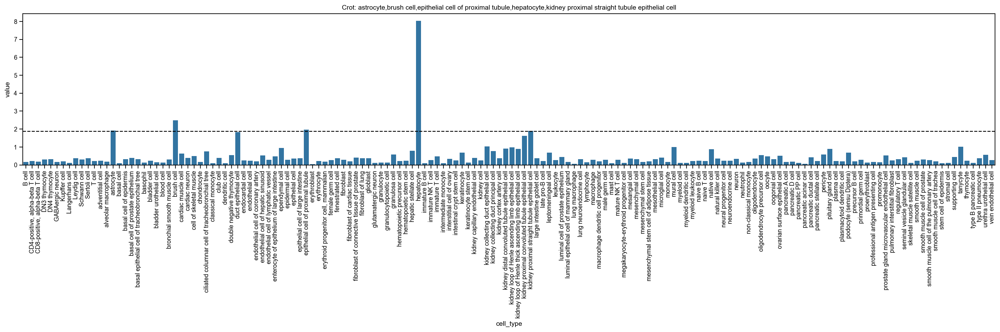

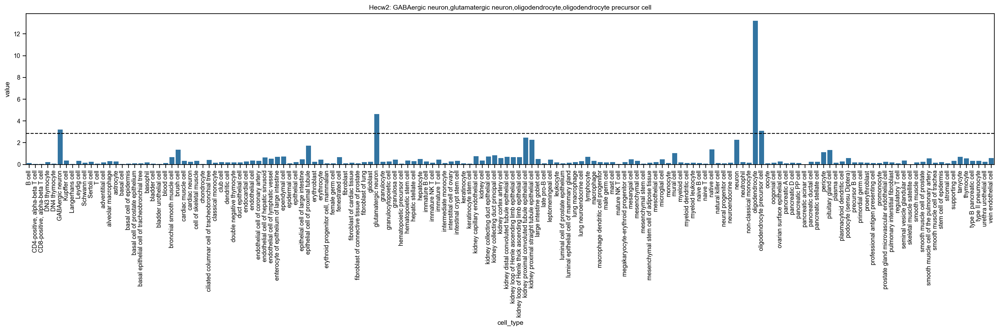

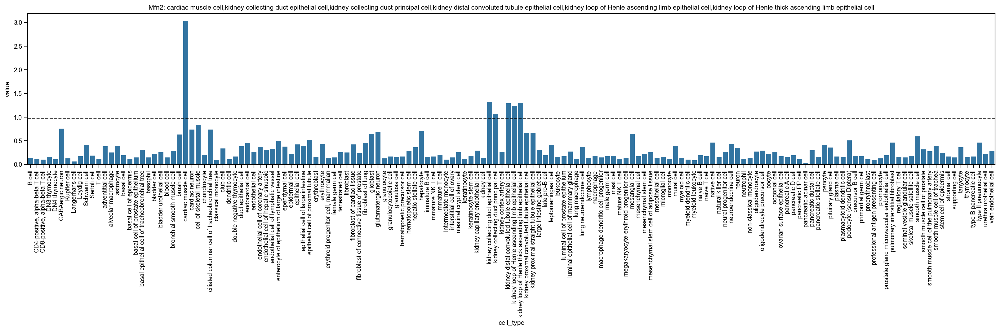

In [ ]:
for gene in gene_list:
    data = pd.DataFrame(expressions["cell_type"][gene]).melt()
    data["cell_type"] = expressions["cell_type"].index
    
    plt.figure(figsize=(25,4))
    sns.barplot(data, x="cell_type", y="value", palette=["tab:blue"])
    plt.xticks(rotation=90)
    plt.axhline(y=2 * expressions["cell_type"][gene].std() + expressions["cell_type"][gene].mean(), c="black", linestyle="--")
    plt.title(f"{gene}: {entropies['cell_type'].loc[gene, 'peak_cell_types']}")
    plt.show()

In [ ]:
for gene in gene_list:
    
    data = pd.DataFrame(expressions["tissue"][gene]).melt()
    data["tissue"] = expressions["tissue"].index
    
    plt.figure(figsize=(15,4))
    sns.barplot(data, x="tissue", y="value", palette=["tab:blue"])
    plt.xticks(rotation=90)
    plt.axhline(y=2 * expressions["tissue"][gene].std() + expressions["tissue"][gene].mean(), c="black", linestyle="--")
    plt.title(f"{gene}: {entropies['cell_type'].loc[gene, 'peak_tissue']}")
    plt.show()

# Save 

In [ ]:
for key, entropy in entropies.items():
    entropy.to_csv(f"../../analysis/TRA/cell_x_gene_atlas_{key}_entropy.csv")